In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

%matplotlib inline

from scipy.spatial.transform import Rotation as R  # for rotations
from scipy import linalg   # for eigenvalues 

import matplotlib.tri as tri

hour = 60*60.

#from apophis_subs import *
import apophis_subs

In [122]:
import importlib  # if you need to reload it!
importlib.reload(apophis_subs)

<module 'apophis_subs' from '/Users/aquillen/Desktop/summer24/rebound-main24/myexamples/pylab/apophis_subs.py'>

In [2]:
### For looking at stress fields from outputs of mass and springs 

In [24]:
mdir = '../apophis5/'  # data directly
froot = 'd1cc'         # simulation output root 
shape_vol=1.98e+07     # for stress tensor , volume of shape model in m^3
t_datadump =900        # time between data dumps, in s
t0 = -hour*3           # time of first data dump w.r.t to perigee time 
iperi= int(-t0/t_datadump)     # which simulation index is at perigee
nsims = 105 # number of particle/spring outputs
tstop = nsims*t_datadump - t0
t_list_hour = np.arange(t0/hour,tstop/hour,t_datadump/hour)  # array of output times 
# from periceter in hours 

In [59]:
print(t_datadump/hour) # this is the time between datadumps!

0.25


In [31]:
# read in simulation outputs and put in a list
def read_sim_list(mdir,froot,shape_vol,nsims):
    sim_list = []
    for i in range(nsims):
        sim = apophis_subs.sim_struct(mdir,froot,i,shape_vol)
        sim_list = np.append(sim_list,sim)
    return sim_list

# rotate all simulations to same orientation as first one
# and make sure first one is oriented in a principal axis direction
def rotate_sim_list(sim_list):
    nsims = sim_list.shape[0]
    sim_list[0].rotate_to_principal() # rotate first simulation to principal axis 
    for i in range(1,nsims):
        sim_list[i].rotate_to_sim(sim_list[0]) # rotate rest to same orientation as first one
    for i in range(0,nsims):
        sim_list[i].compute_stress_tensor()  # compute stress tensor for all of them 
        sim_list[i].compute_L()  # compute spin


In [96]:
# read in a rotate a list of simulations 
sim_list = read_sim_list(mdir,froot,shape_vol,nsims)        
rotate_sim_list(sim_list) # do rotations and compute stress tensor

../apophis5/d1cc_000000_springs.txt
../apophis5/d1cc_000000_particles.txt
../apophis5/d1cc_000001_springs.txt
../apophis5/d1cc_000001_particles.txt
../apophis5/d1cc_000002_springs.txt
../apophis5/d1cc_000002_particles.txt
../apophis5/d1cc_000003_springs.txt
../apophis5/d1cc_000003_particles.txt
../apophis5/d1cc_000004_springs.txt
../apophis5/d1cc_000004_particles.txt
../apophis5/d1cc_000005_springs.txt
../apophis5/d1cc_000005_particles.txt
../apophis5/d1cc_000006_springs.txt
../apophis5/d1cc_000006_particles.txt
../apophis5/d1cc_000007_springs.txt
../apophis5/d1cc_000007_particles.txt
../apophis5/d1cc_000008_springs.txt
../apophis5/d1cc_000008_particles.txt
../apophis5/d1cc_000009_springs.txt
../apophis5/d1cc_000009_particles.txt
../apophis5/d1cc_000010_springs.txt
../apophis5/d1cc_000010_particles.txt
../apophis5/d1cc_000011_springs.txt
../apophis5/d1cc_000011_particles.txt
../apophis5/d1cc_000012_springs.txt
../apophis5/d1cc_000012_particles.txt
../apophis5/d1cc_000013_springs.txt
..

In [97]:
# read in second simulation outputs and put in a list and rotate!
froot_b = 'd2cc'         # simulation output root 
sim_list_b = read_sim_list(mdir,froot_b,shape_vol,nsims)        
rotate_sim_list(sim_list_b)


../apophis5/d2cc_000000_springs.txt
../apophis5/d2cc_000000_particles.txt
../apophis5/d2cc_000001_springs.txt
../apophis5/d2cc_000001_particles.txt
../apophis5/d2cc_000002_springs.txt
../apophis5/d2cc_000002_particles.txt
../apophis5/d2cc_000003_springs.txt
../apophis5/d2cc_000003_particles.txt
../apophis5/d2cc_000004_springs.txt
../apophis5/d2cc_000004_particles.txt
../apophis5/d2cc_000005_springs.txt
../apophis5/d2cc_000005_particles.txt
../apophis5/d2cc_000006_springs.txt
../apophis5/d2cc_000006_particles.txt
../apophis5/d2cc_000007_springs.txt
../apophis5/d2cc_000007_particles.txt
../apophis5/d2cc_000008_springs.txt
../apophis5/d2cc_000008_particles.txt
../apophis5/d2cc_000009_springs.txt
../apophis5/d2cc_000009_particles.txt
../apophis5/d2cc_000010_springs.txt
../apophis5/d2cc_000010_particles.txt
../apophis5/d2cc_000011_springs.txt
../apophis5/d2cc_000011_particles.txt
../apophis5/d2cc_000012_springs.txt
../apophis5/d2cc_000012_particles.txt
../apophis5/d2cc_000013_springs.txt
..

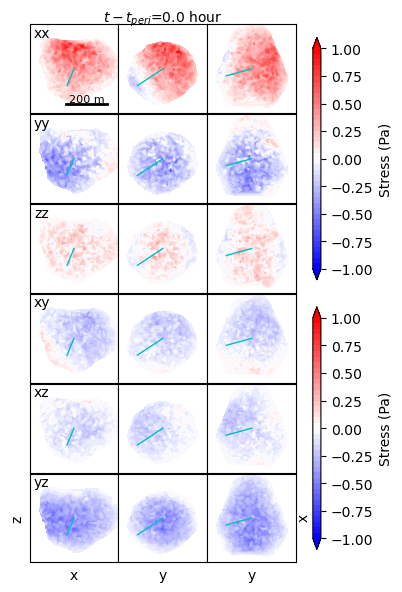

In [116]:
j = iperi; tlabel ='{:.1f}'.format(t_list_hour[j])
apophis_subs.plt_sig6(sim_list[j],sim_list[0],1,-1.0,1.05,0.05,-1.0,1.05,0.05,tlabel,'')

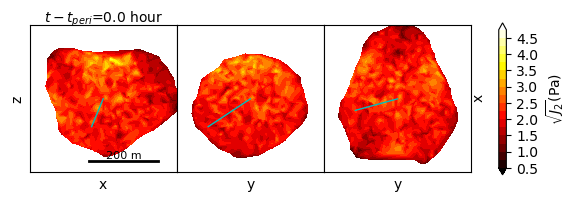

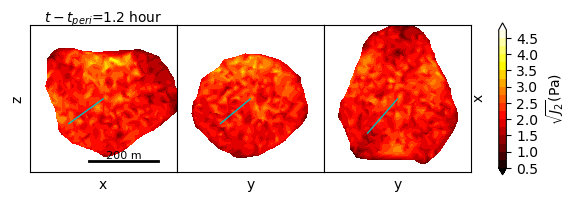

In [99]:
zl = 0.5; zh = 5; zstep=0.25
j=iperi; tlabel ='{:.1f}'.format(t_list_hour[j])
apophis_subs.plt_J2(sim_list[j],sim_list[0],0,zl,zh,zstep,tlabel,'')
j=iperi+5; tlabel ='{:.1f}'.format(t_list_hour[j])
apophis_subs.plt_J2(sim_list[j],sim_list[0],0,zl,zh,zstep,tlabel,'')


/Users/aquillen/Desktop/summer24/rebound-main24/myexamples/pylab/apophis_subs.py:437: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  newcolors = np.vstack((top(np.linspace(0, 1, 128)),\


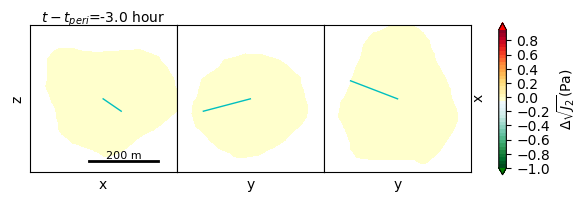

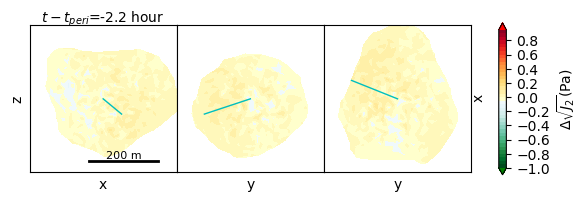

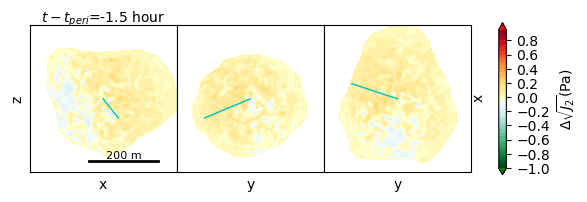

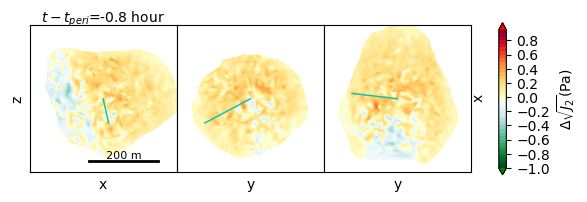

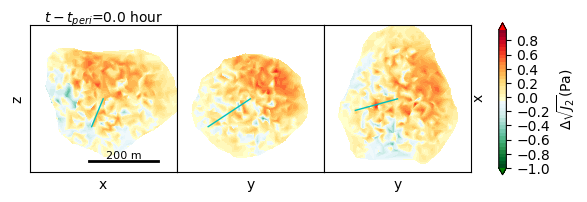

...

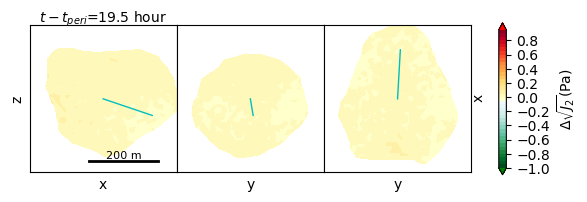

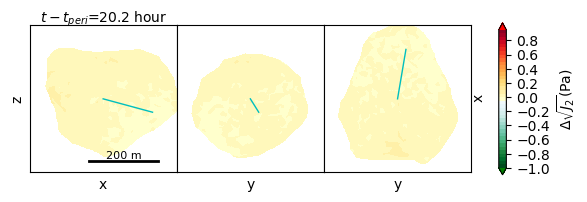

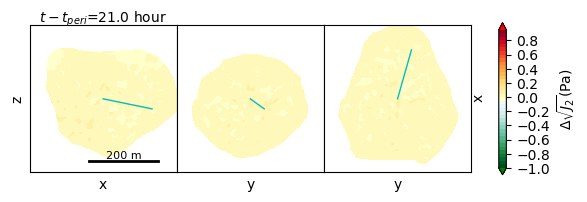

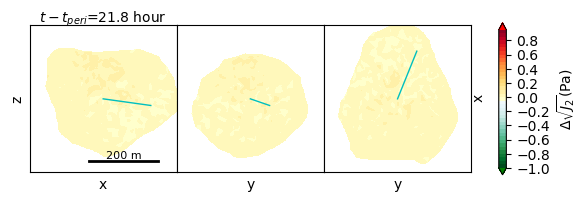

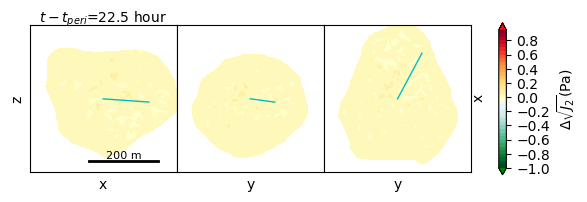

In [100]:
zl = -1.0 # start 
zh = 1.0 # stop
zstep = 0.05 # step 
#plt_J2(sim_1 ,sim_1,0,zl,zh,'')
for i in range(0,sim_list.shape[0],3):
    jstr = '{:d}'.format(i) #froot + '_0_J2.png'
    if (i<10):
        jstr = '0' + jstr
    ofile = froot + '_' + jstr + '_' + 'J2.png'
    #print(ofile)
    tlabel ='{:.1f}'.format(t_list_hour[i])
    apophis_subs.plt_J2(sim_list[i] ,sim_list[0],1,zl,zh,zstep,tlabel,ofile)
    

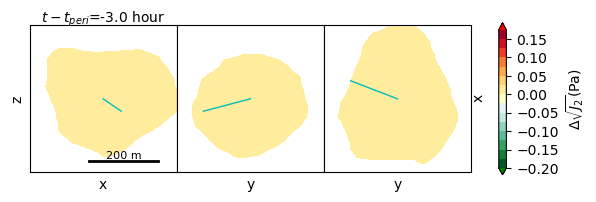

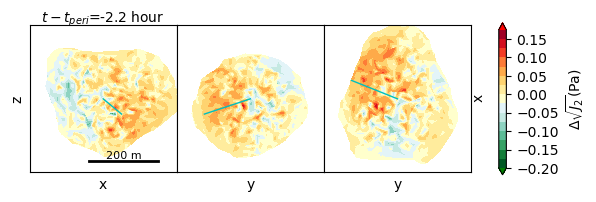

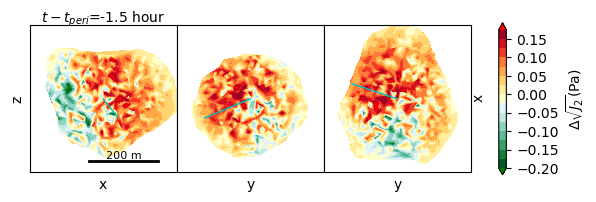

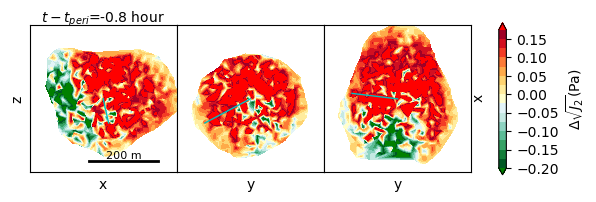

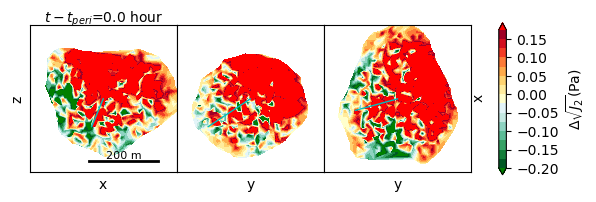

...

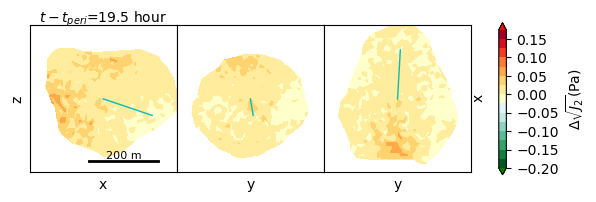

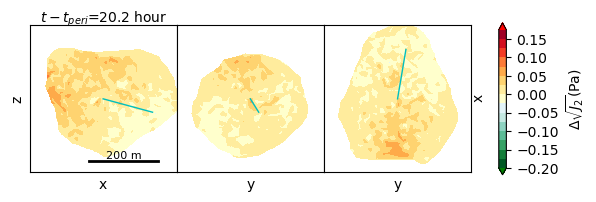

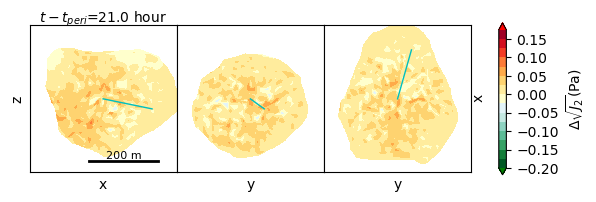

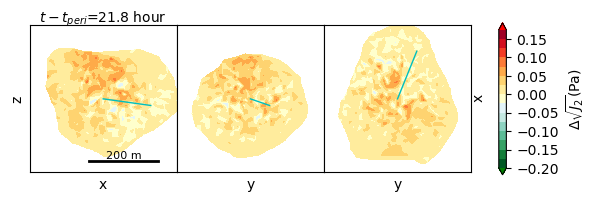

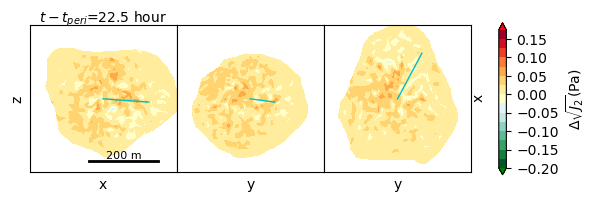

In [101]:
zl = -0.2 # start 
zh = 0.2 # stop
zstep = 0.025 # step 
#plt_J2(sim_1 ,sim_1,0,zl,zh,'')
for i in range(0,sim_list.shape[0],3):
    jstr = '{:d}'.format(i) #froot + '_0_J2.png'
    if (i<10):
        jstr = '0' + jstr
    ofile = froot + '_' + jstr + '_b_' + 'J2.png'
    #print(ofile)
    tlabel ='{:.1f}'.format(t_list_hour[i])
    apophis_subs.plt_J2(sim_list[i] ,sim_list[0],1,zl,zh,zstep,tlabel,ofile)
    
# this either shows wobble or normal modes
    

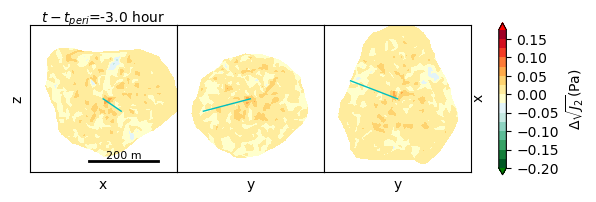

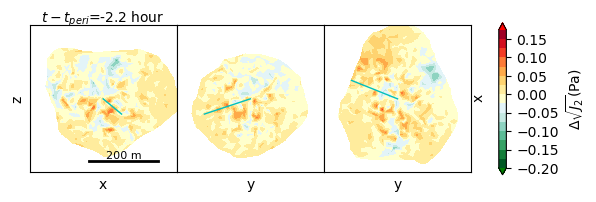

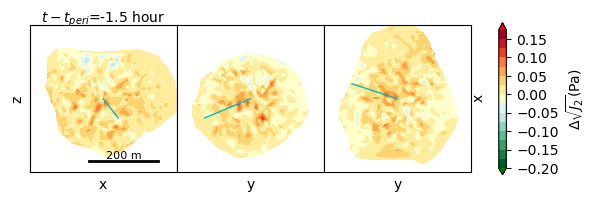

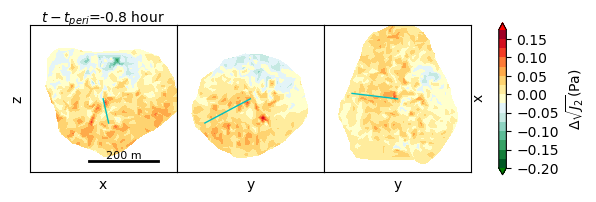

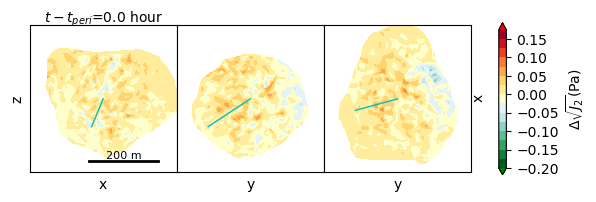

...

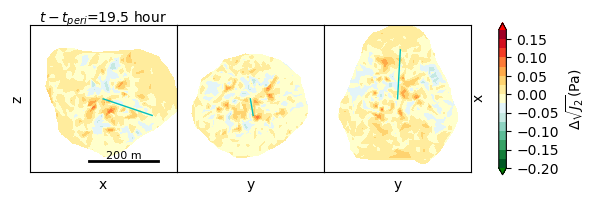

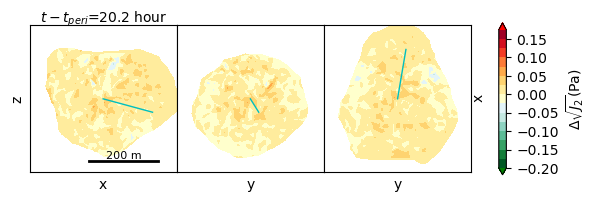

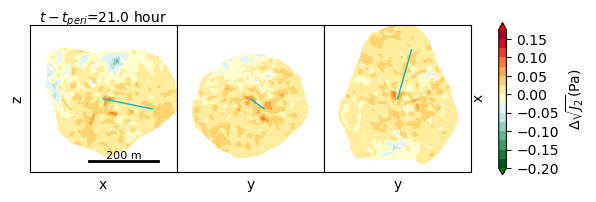

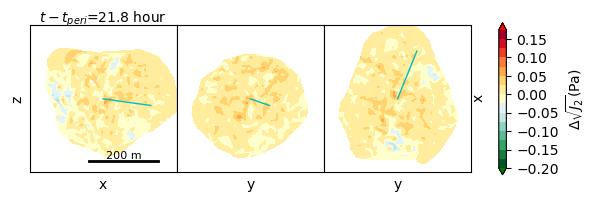

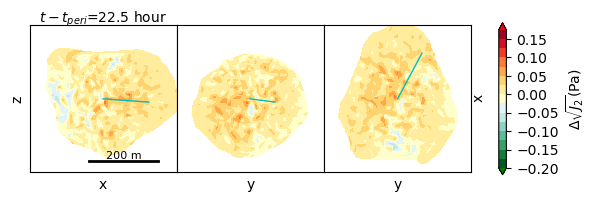

In [102]:
zl = -0.2 # start 
zh = 0.2 # stop
zstep = 0.025 # step 

for i in range(0,nsims,3):
    jstr = '{:d}'.format(i) #froot + '_0_J2.png'
    if (i<10):
        jstr = '0' + jstr
    ofile = froot + '_' + jstr + '_b_' + 'J2.png'
    #print(ofile)
    tlabel ='{:.1f}'.format(t_list_hour[i])
    apophis_subs.plt_J2(sim_list[i] ,sim_list_b[i],1,zl,zh,zstep,tlabel,ofile)
    # comparing two simulations!
    
# this either shows wobble or normal modes

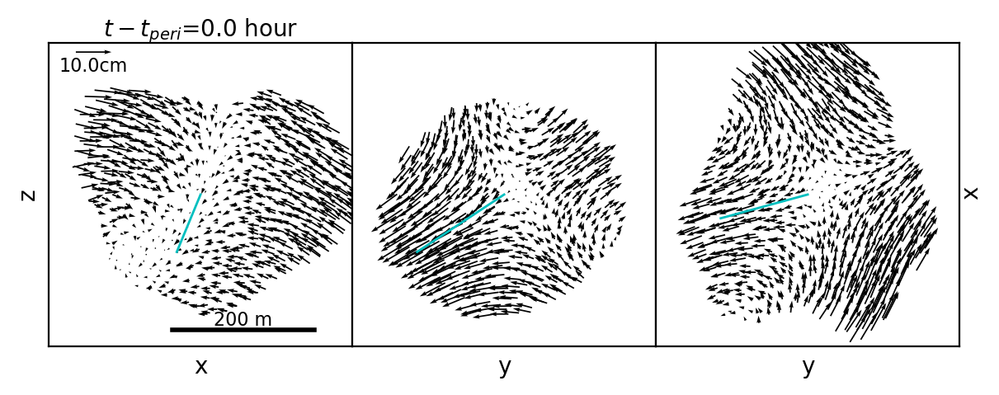

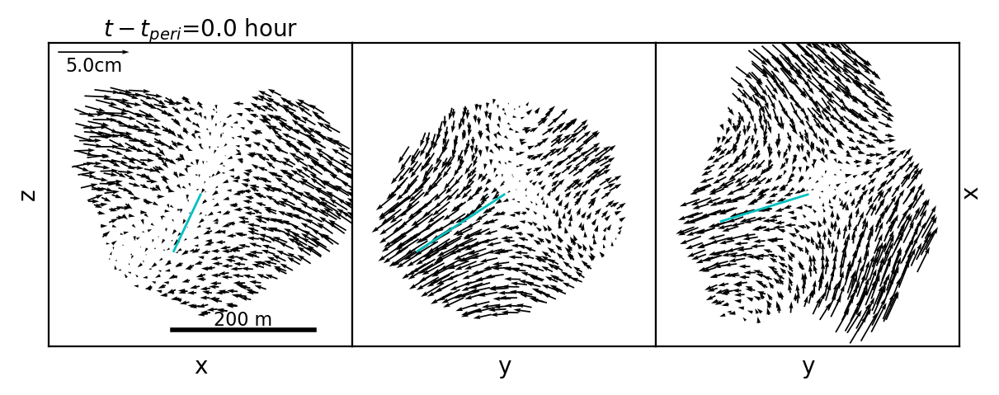

In [123]:
i = iperi
Qscale = 2e-3;  # for adjusting arrow length
Qkey_len=0.1 # quiver key length in m
tlabel ='{:.1f}'.format(t_list_hour[i])
jstr = '{:d}'.format(i) #froot + '_0_J2.png'
if (i<10):
    jstr = '0' + jstr
ofile = froot + '_' + jstr  + 'Q.png'
ofile_b = froot_b + '_' + jstr  + 'Q.png'
apophis_subs.plt_def3(sim_list[i] ,sim_list[0],Qscale,Qkey_len,tlabel,ofile)
Qscale = 5e-4; Qkey_len=0.05 
apophis_subs.plt_def3(sim_list_b[i] ,sim_list_b[0],Qscale,Qkey_len,tlabel,ofile)

In [ ]:
# we conclude that deformation at perigee scales inversely with elastic modulus 
# this is expected!

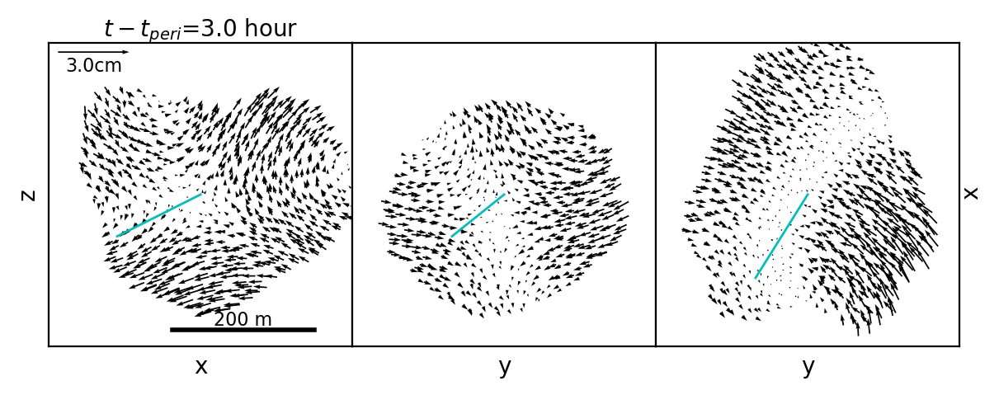

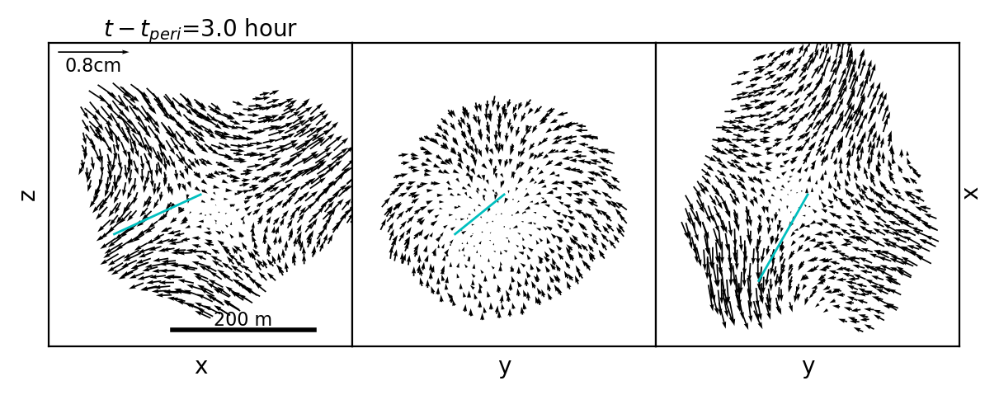

In [118]:
i = iperi + 12  # 3 hours after pericenter?
tlabel ='{:.1f}'.format(t_list_hour[i])
Qscale = 3e-4; Qkey_len = 0.03
apophis_subs.plt_def3(sim_list[i]   ,sim_list[0],Qscale,Qkey_len,tlabel,'')
apophis_subs.plt_def3(sim_list_b[i] ,sim_list_b[0],Qscale/4,Qkey_len/4,tlabel,'')

In [ ]:
### three hours after perigee we see quite different patterns
### these are probably due to normal mode excitation 

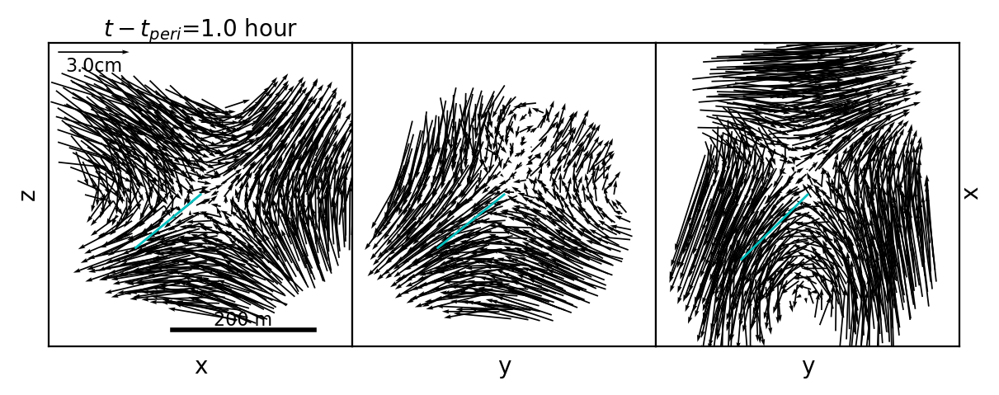

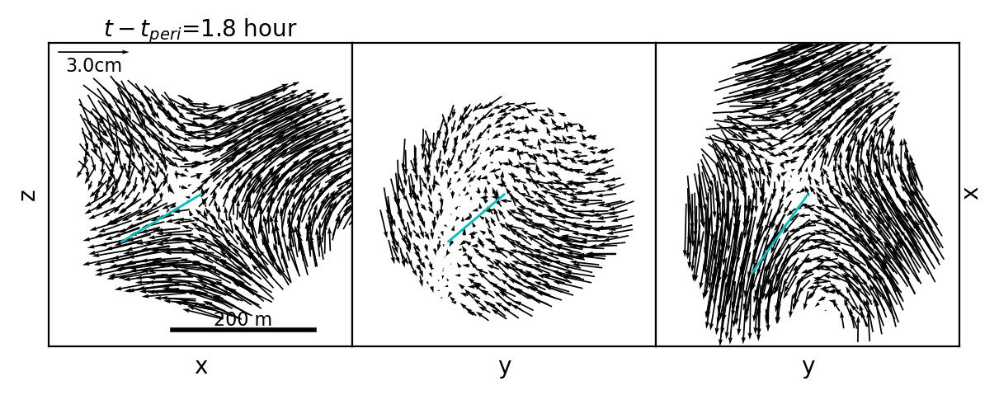

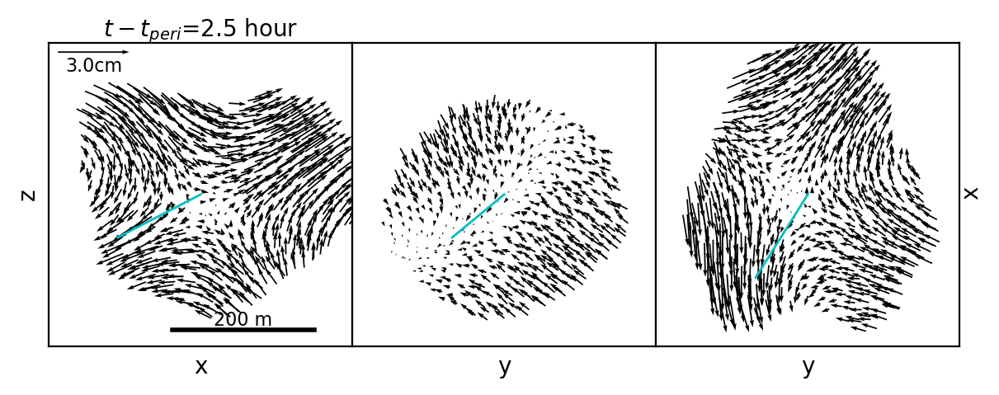

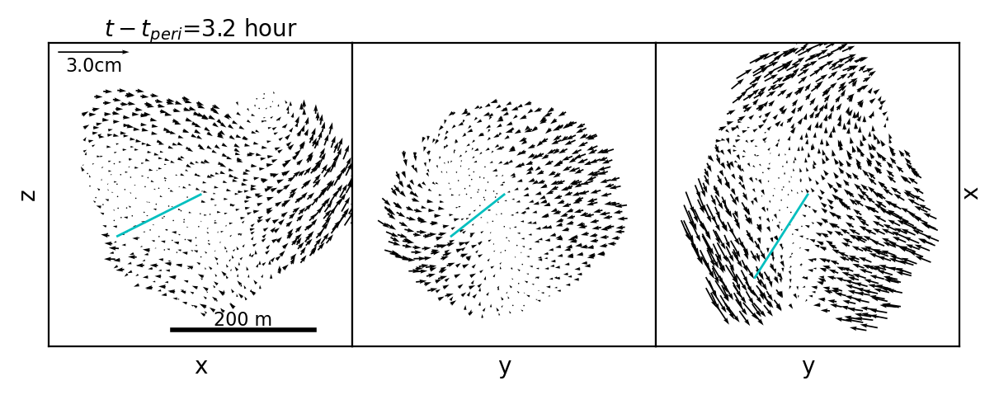

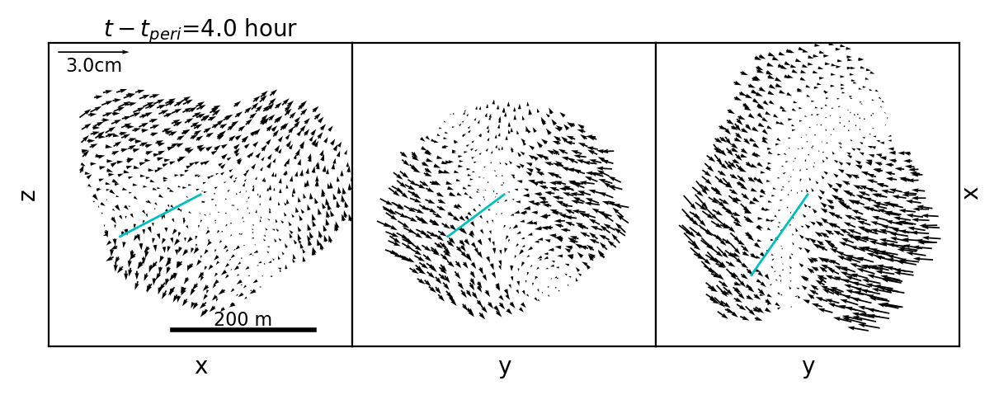

...

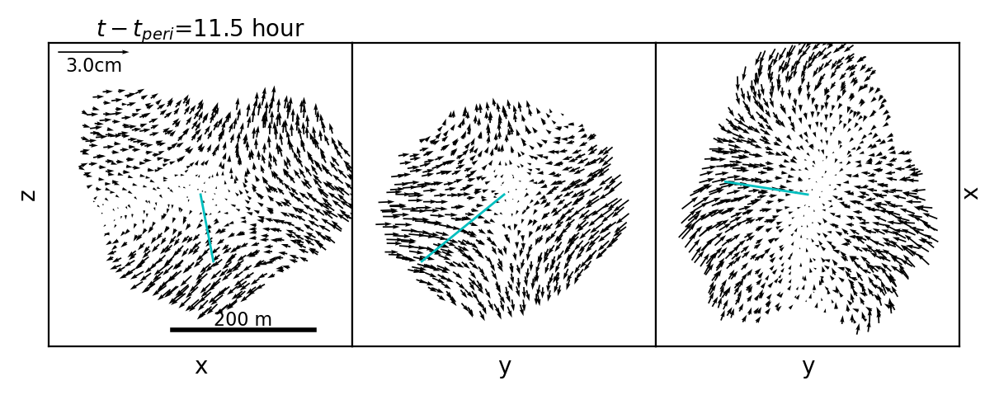

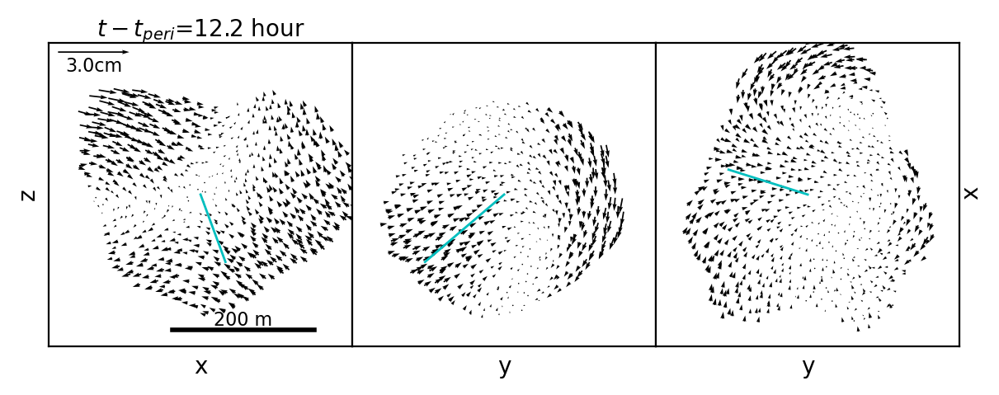

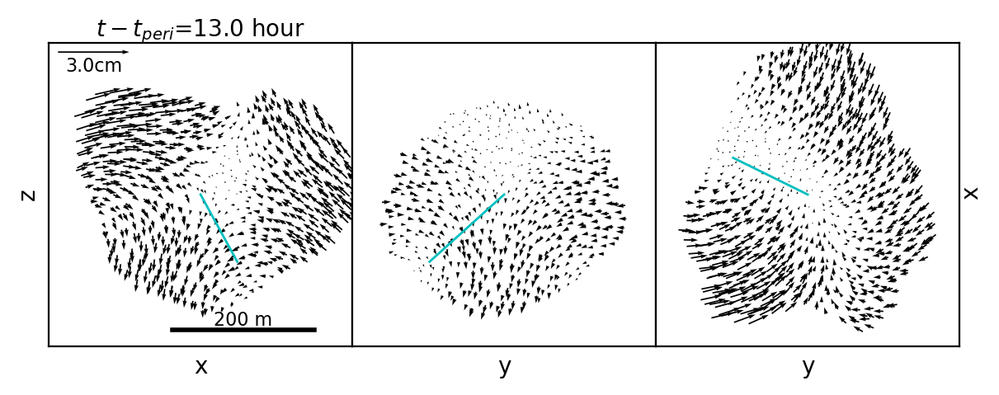

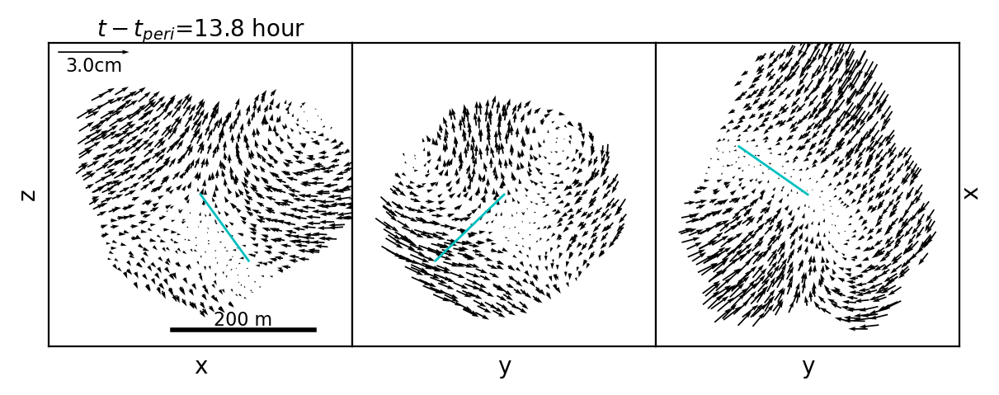

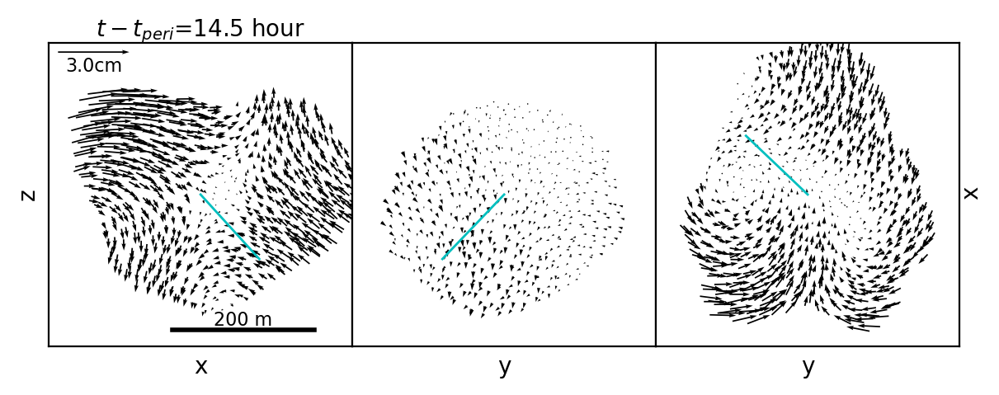

In [126]:
Qscale = 3e-4; Qkey_len = 0.03
for i in range(iperi+4,iperi+60,3):
    tlabel ='{:.1f}'.format(t_list_hour[i])
    jstr = '{:d}'.format(i) #froot + '_0_J2.png'
    if (i<10):
        jstr = '0' + jstr
    ofile = froot + '_' + jstr + 'Qs.png'
    apophis_subs.plt_def3(sim_list[i]   ,sim_list[0],Qscale,Qkey_len,tlabel,ofile)
#apophis_subs.plt_def3(sim_list_b[i] ,sim_list_b[0],Qscale/4,Qkey_len/4,tlabel,'')

### the fast changes seen imply normal modes explanation
 Wobble could be increased I suppose, but not that much 

In [75]:
# read in second simulation outputs and put in a list and rotate!
froot_0 = 'd1'         # simulation output root 
nsims_0 = 20
sim_list_0 = read_sim_list(mdir,froot_0,shape_vol,nsims_0)        
rotate_sim_list(sim_list_0)
# without Earth , relaxation run


../apophis5/d1_000000_springs.txt
../apophis5/d1_000000_particles.txt
../apophis5/d1_000001_springs.txt
../apophis5/d1_000001_particles.txt
../apophis5/d1_000002_springs.txt
../apophis5/d1_000002_particles.txt
../apophis5/d1_000003_springs.txt
../apophis5/d1_000003_particles.txt
../apophis5/d1_000004_springs.txt
../apophis5/d1_000004_particles.txt
../apophis5/d1_000005_springs.txt
../apophis5/d1_000005_particles.txt
../apophis5/d1_000006_springs.txt
../apophis5/d1_000006_particles.txt
../apophis5/d1_000007_springs.txt
../apophis5/d1_000007_particles.txt
../apophis5/d1_000008_springs.txt
../apophis5/d1_000008_particles.txt
../apophis5/d1_000009_springs.txt
../apophis5/d1_000009_particles.txt
../apophis5/d1_000010_springs.txt
../apophis5/d1_000010_particles.txt
../apophis5/d1_000011_springs.txt
../apophis5/d1_000011_particles.txt
../apophis5/d1_000012_springs.txt
../apophis5/d1_000012_particles.txt
../apophis5/d1_000013_springs.txt
../apophis5/d1_000013_particles.txt
../apophis5/d1_00001

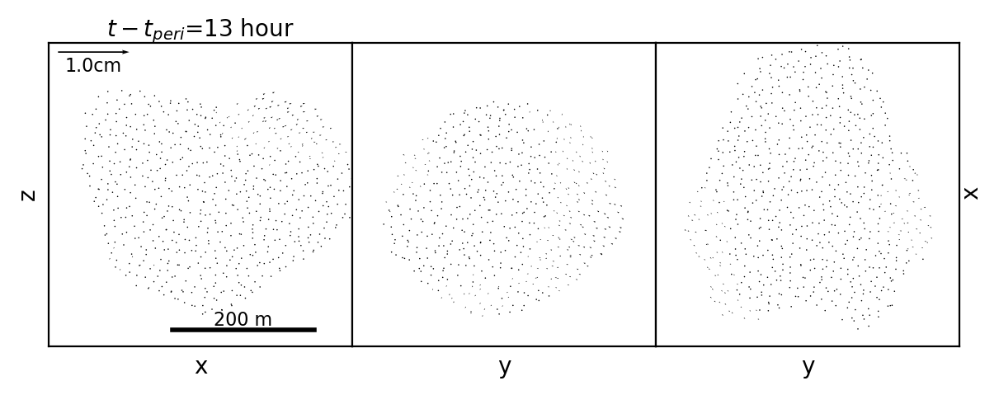

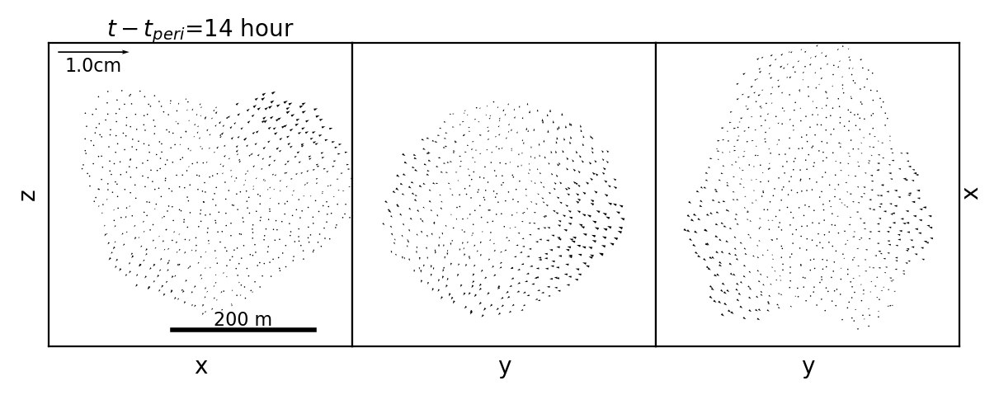

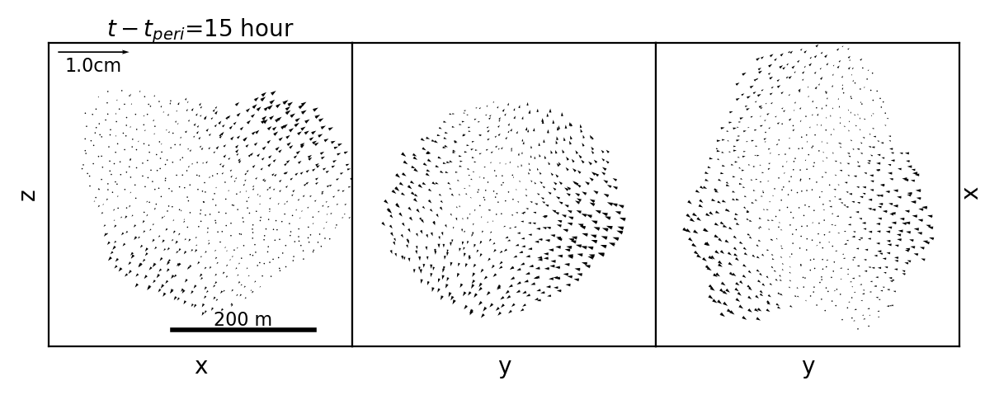

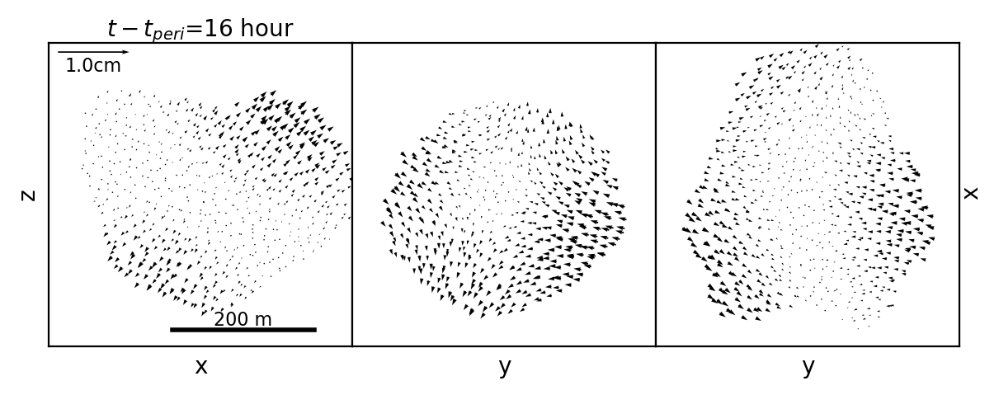

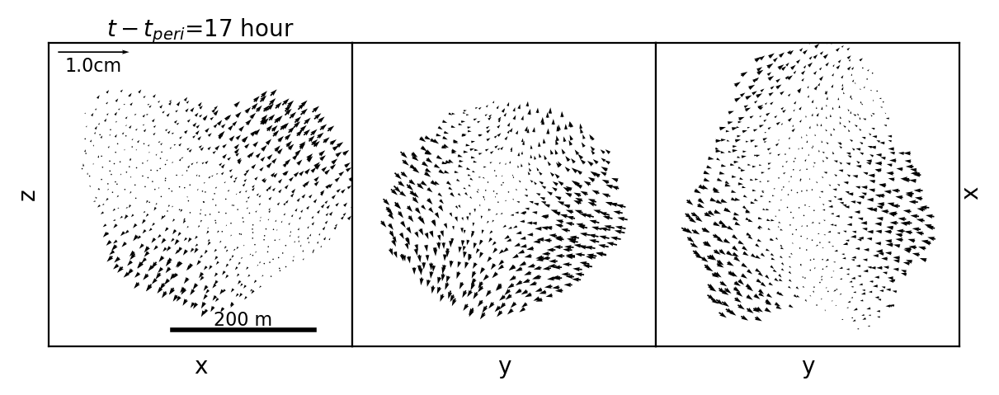

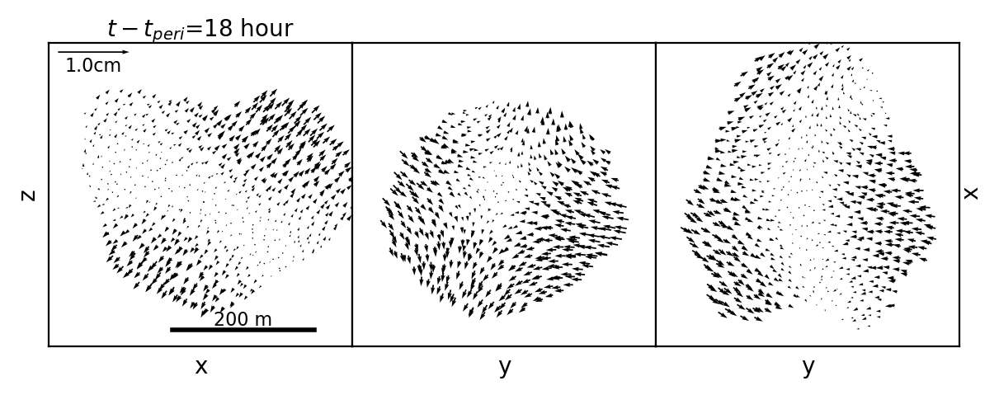

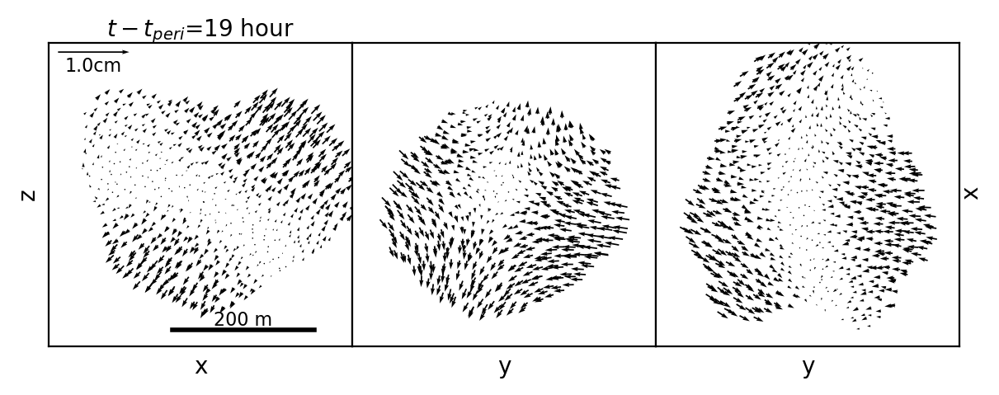

In [124]:
#for i in range(0,sim_list_0.shape[0]):
# start at 10 because that is after relaxation
i0 = 12
Qscale = 1e-4; Qkey_len = 0.01
for i in range(i0+1,20):
    tlabel ='{:d}'.format(i)  # in hours
    
    jstr = '{:d}'.format(i) #froot + '_0_J2.png'
    if (i<10):
        jstr = '0' + jstr
    
    if (i==19):
        ofile = froot_0 + '_' + jstr  + 'Q.png'
    else:
        ofile = ''
        
    apophis_subs.plt_def3(sim_list_0[i]   ,sim_list_0[i0],Qscale,Qkey_len,tlabel,ofile)
    
# this seems like rotation wobble !


### these show wobbe because there is no Earth in this simulation
the accelerations are lower than after the tidal encounter 
so normal mode excitation is possible, the level needed is 
 about an order of magnitude deeper sensitivity with seismometer. 

In [ ]:
# not currently used!

Text(0.5, 0, '$t - t_{peri}$ (hour)')

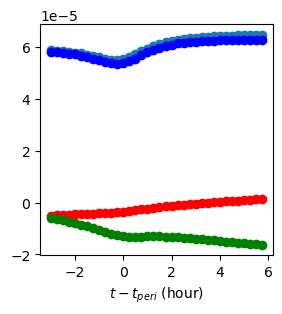

In [41]:
# let's look at the spin vector 
Omega_list = np.zeros((nsims,3))
Om_mag = np.zeros(nsims)
for i in range(nsims):
    Omega_list[i] = np.squeeze(sim_list[i].Omega)
    Om_mag[i] = np.sqrt(np.sum(sim_list[i].Omega**2))
    
tstop = nsims*t_datadump/hour + t0/hour
t_list_hour = np.arange(t0/hour,tstop,t_datadump/hour)

fig,ax = plt.subplots(1,1,figsize=(3,3))
ax.plot(t_list,Om_mag,'o')
ax.plot(t_list_hour,-Omega_list[:,0],'ro') # magnitudes so easier to see on same plot
ax.plot(t_list_hour,Omega_list[:,1],'go')
ax.plot(t_list_hour,-Omega_list[:,2],'bo')
ax.set_xlabel(r'$t - t_{peri}$ (hour)')

In [42]:
# save omega information so could be read in later!
outfile = froot + '_om.npz'
np.savez(outfile, t_list, Om_mag)

In [104]:
# looking at spring strain distributions 
sim_list[6].compute_spring_lengths()
sim_list[0].compute_spring_lengths()
strain6= (sim_list[6].Larr - sim_list[6].rs0)/sim_list[6].rs0
strain0= (sim_list[0].Larr - sim_list[0].rs0)/sim_list[0].rs0

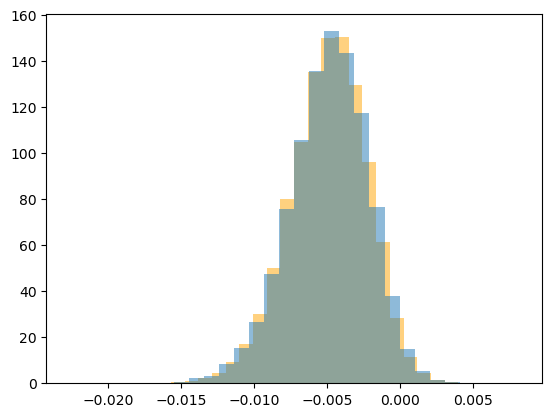

In [114]:
plt.hist(strain6,alpha=0.5,bins=30,color='orange',density=True)
junk=plt.hist(strain0,alpha=0.5,bins=30,density=True)
# original strain distribution is slightly narrower than during encounter 

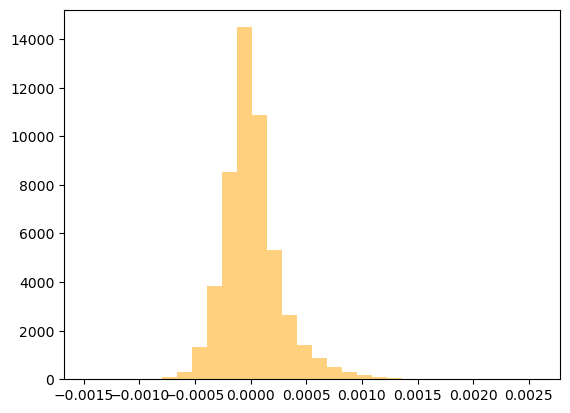

In [116]:
junk=plt.hist(strain6-strain0,bins=30,alpha=0.5,color='orange')
# size of change in strain is maybe 1/4 percent?

In [100]:
ii = np.argmax(sim_list[6].J2-sim_list[0].J2)
print(ii,sim_list[6].pos[ii])
ii = np.argmin(sim_list[6].J2-sim_list[0].J2)
print(ii,sim_list[6].pos[ii])

1722 [-124.6188253    72.03420867  -13.44659885]
1907 [76.54579118 52.99569246 76.36333716]
